# Import libraries

In [1]:
import pandas as pd
import pylab as plt
import numpy as np
import matplotlib.pyplot as plt
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split, cross_val_score
from scipy.signal import find_peaks
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.utils import shuffle
from sklearn.tree import DecisionTreeClassifier, export_graphviz


## load data

In [2]:
dfs_uncleaned = []
column_names = ['time_step', 'acc_x', 'acc_y', 'acc_z']
for i in range(1, 23):
    filename = f"{i}.csv"
    var_name = f"df{i}"
    exec(f"{var_name} = pd.read_csv('{filename}',names=column_names)")
    exec(f"{var_name}['target']= {i}")
    dfs_uncleaned.append(eval(var_name)) 


In [3]:
dfs_uncleaned[0]



,time_step,acc_x,acc_y,acc_z,target
0,0.000000,0.69464,3.17350,7.5048,1
1,0.030639,0.14982,3.48680,9.2755,1
2,0.069763,-0.29965,1.94770,9.1120,1
3,0.099823,-1.68890,1.41650,10.1200,1
4,0.129820,-2.17930,0.95342,10.9240,1
...,...,...,...,...,...
5064,154.070000,-0.69464,5.05310,8.0769,1
5065,154.100000,-0.14982,5.17570,9.0030,1
5066,154.140000,-0.53119,5.32560,8.1177,1
5067,154.170000,-0.80360,5.28470,7.8589,1


In [4]:
#check shape
for df in dfs_uncleaned:
    print(df.shape)
#no missing columns. big range in rows


(5069, 5)
(3882, 5)
(1144, 5)
(6981, 5)
(1129, 5)
(4936, 5)
(3729, 5)
(3457, 5)
(7988, 5)
(3086, 5)
(5636, 5)
(4799, 5)
(6699, 5)
(12027, 5)
(3653, 5)
(1728, 5)
(21991, 5)
(20758, 5)
(911, 5)
(16949, 5)
(3082, 5)
(9698, 5)


In [5]:
#check for Null values
for df in dfs_uncleaned:
    print(df.isnull().sum())
#no null values



time_step    0
acc_x        0
acc_y        0
acc_z        0
target       0
dtype: int64
time_step    0
acc_x        0
acc_y        0
acc_z        0
target       0
dtype: int64
time_step    0
acc_x        0
acc_y        0
acc_z        0
target       0
dtype: int64
time_step    0
acc_x        0
acc_y        0
acc_z        0
target       0
dtype: int64
time_step    0
acc_x        0
acc_y        0
acc_z        0
target       0
dtype: int64
time_step    0
acc_x        0
acc_y        0
acc_z        0
target       0
dtype: int64
time_step    0
acc_x        0
acc_y        0
acc_z        0
target       0
dtype: int64
time_step    0
acc_x        0
acc_y        0
acc_z        0
target       0
dtype: int64
time_step    0
acc_x        0
acc_y        0
acc_z        0
target       0
dtype: int64
time_step    0
acc_x        0
acc_y        0
acc_z        0
target       0
dtype: int64
time_step    0
acc_x        0
acc_y        0
acc_z        0
target       0
dtype: int64
time_step    0
acc_x        0
ac

In [6]:
#check for basic statistics of each dataframe
for df in dfs_uncleaned:
    print(df.describe())
#lowest is 911 rows
#highest is 21991 rows



        time_step        acc_x        acc_y        acc_z  target
count  5069.00000  5069.000000  5069.000000  5069.000000  5069.0
mean     76.81745    -3.554254     8.557989    -0.844095     1.0
std      44.23811     2.486629     2.956517     2.913708     0.0
min       0.00000    -9.343600     0.000000    -7.927000     1.0
25%      38.57000    -5.284700     6.129200    -2.601500     1.0
50%      76.82000    -3.486800     8.921300    -1.144100     1.0
75%     115.01000    -2.179300    10.651000    -0.040861     1.0
max     154.20000    10.951000    15.786000    12.599000     1.0
         time_step        acc_x        acc_y        acc_z  target
count  3882.000000  3882.000000  3882.000000  3882.000000  3882.0
mean     66.869213    -0.537229     9.296086     0.568778     2.0
std      37.951692     1.602373     1.933470     2.280344     0.0
min       0.000000    -6.238100     2.601500    -6.401600     2.0
25%      34.217750    -1.498200     8.431000    -0.694640     2.0
50%      69.045000 

In [7]:
for df in dfs_uncleaned:
        print(df['time_step'].diff().mean())
#the time between each sample is more or less the same at 0.03 seconds



0.030426203630623518
0.03382891007472301
0.03167979002624672
0.03138825214899713
0.03161879432624113
0.030567375886524823
0.03126877682403433
0.03116898148148148
0.032067109052209844
0.030755267423014584
0.030773735581188996
0.032105043768236766
0.03224096745297103
0.031050224513553968
0.03044633077765608
0.031876085697741745
0.030772169167803544
0.031579708050296286
0.032032967032967034
0.030205333962709465
0.03219733852645245
0.03148396411261215


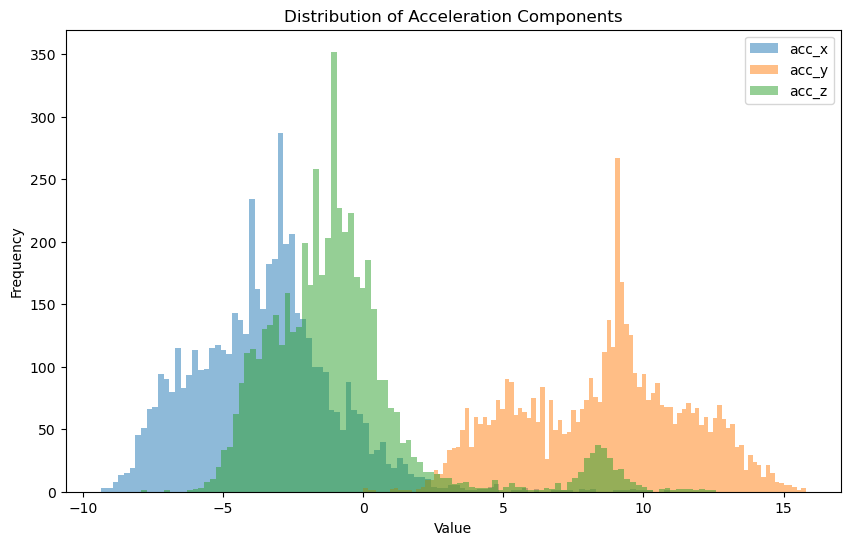

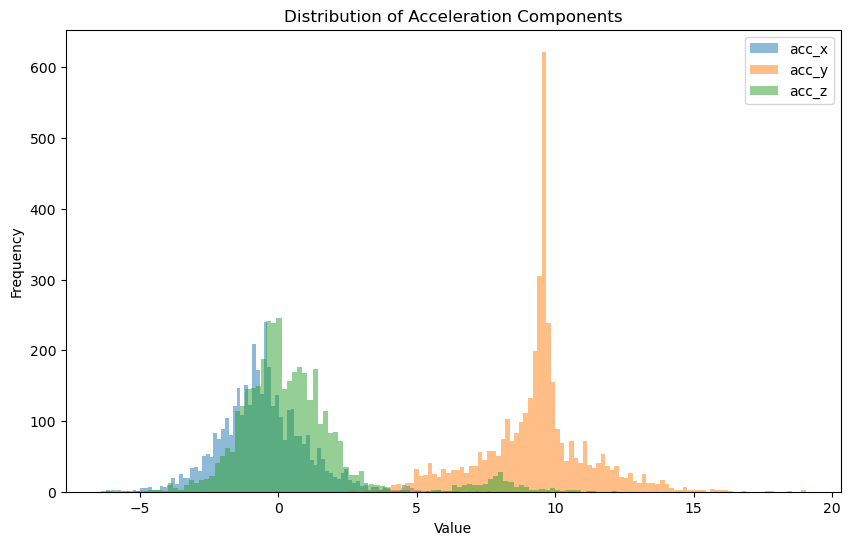

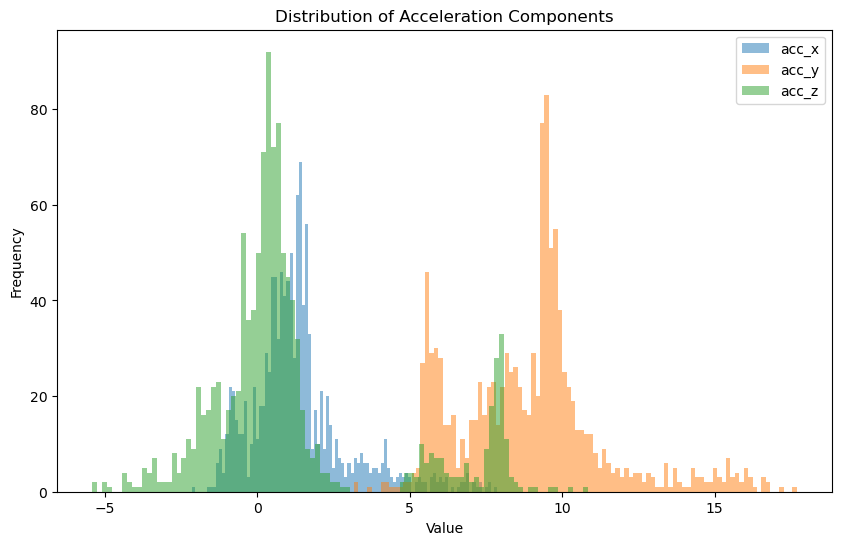

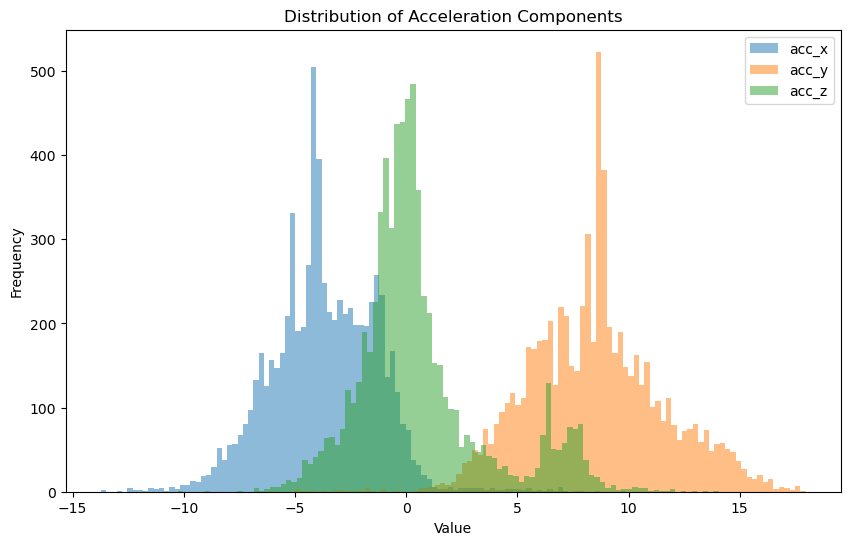

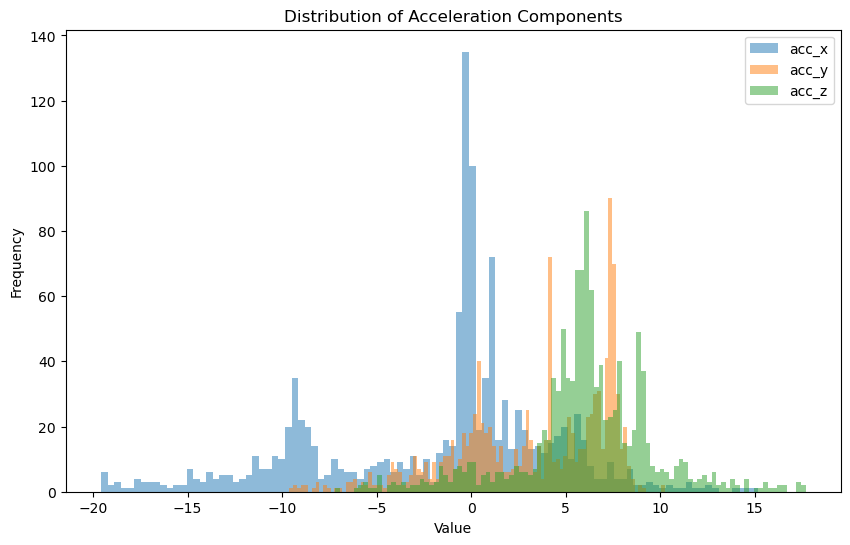

...

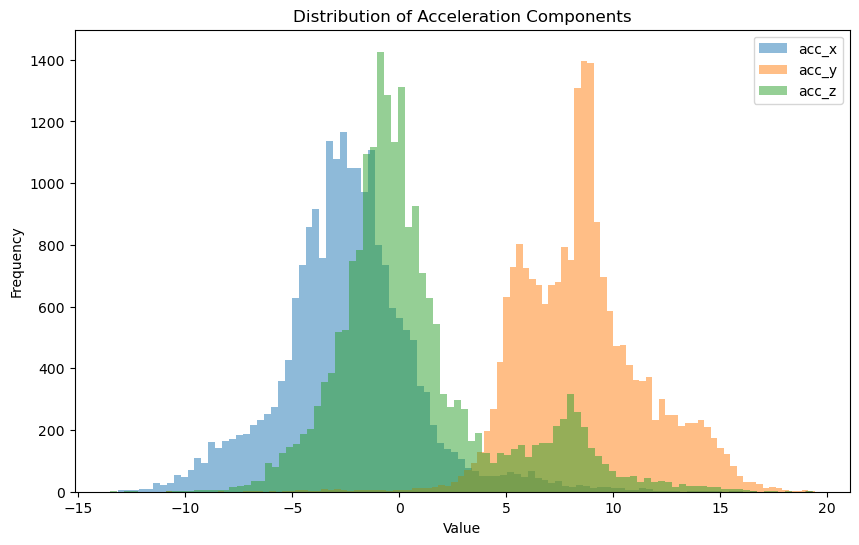

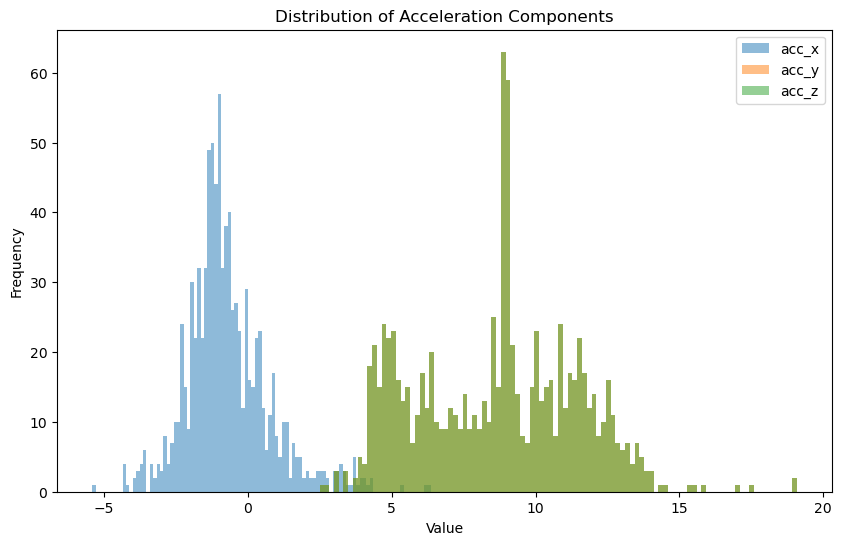

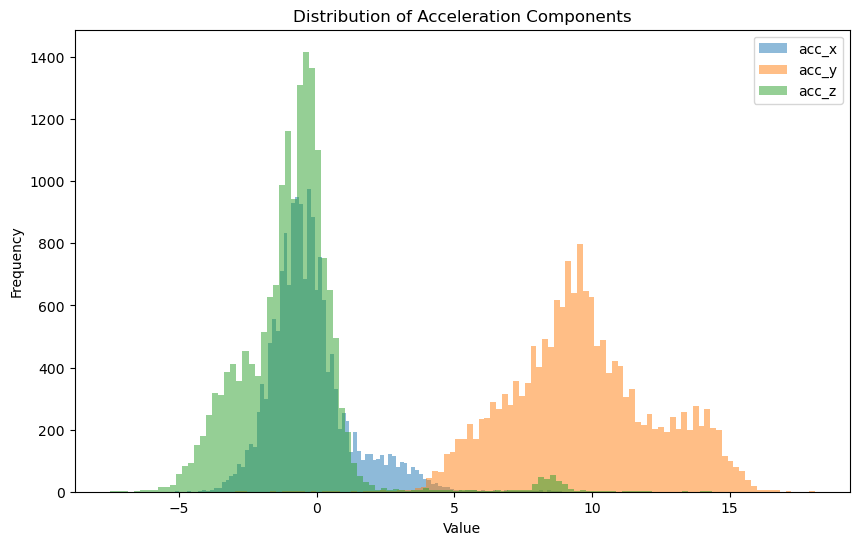

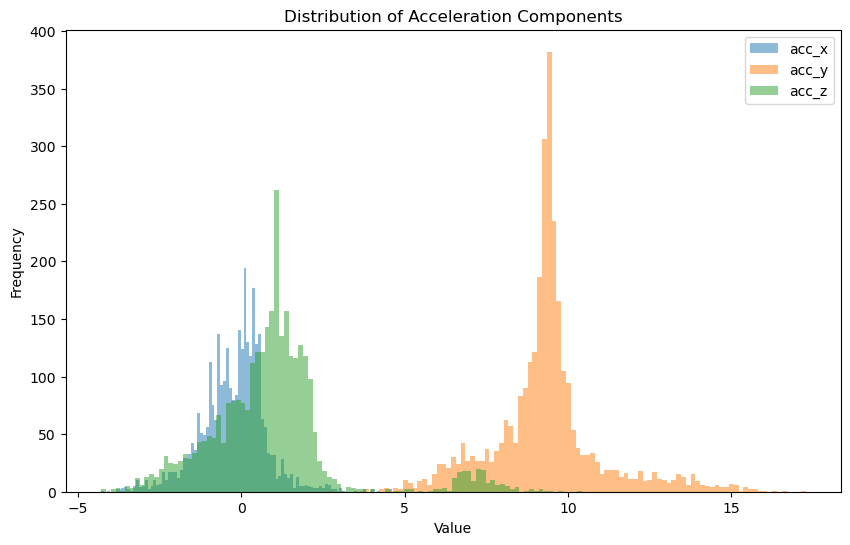

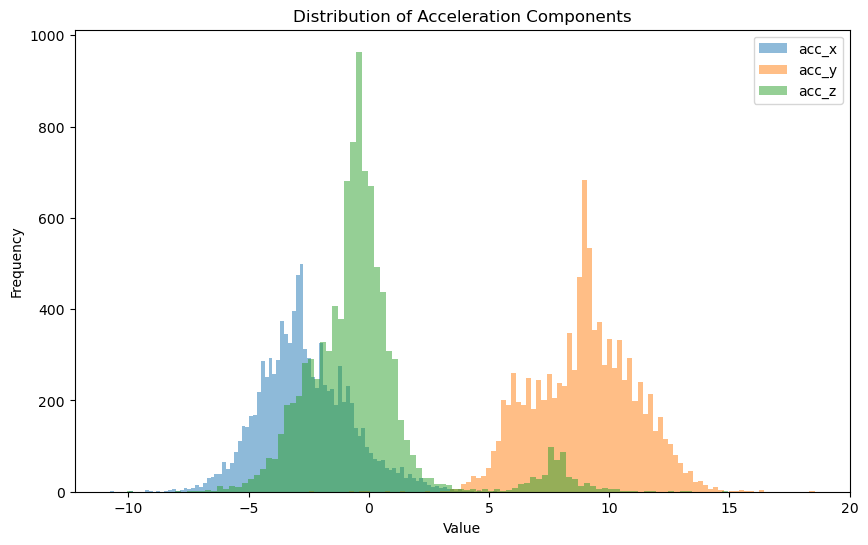

In [8]:
#plot the distribution
for df in dfs_uncleaned:
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.hist(df['acc_x'], bins=100, alpha=0.5, label='acc_x')
    ax.hist(df['acc_y'], bins=100, alpha=0.5, label='acc_y')
    ax.hist(df['acc_z'], bins=100, alpha=0.5, label='acc_z')
    ax.set_xlabel('Value')
    ax.set_ylabel('Frequency')
    ax.set_title('Distribution of Acceleration Components')
    ax.legend()
    plt.show()
    

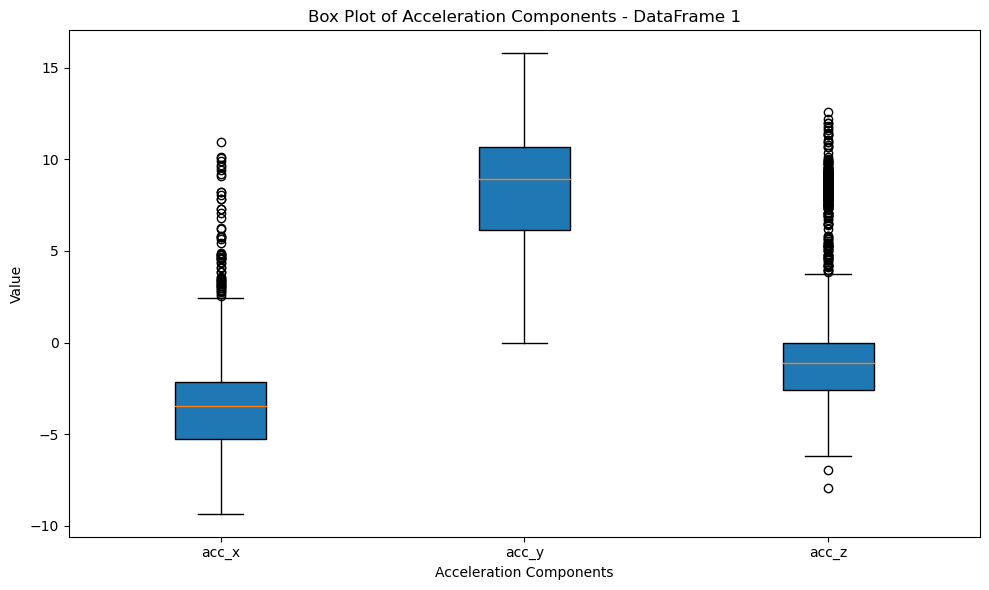

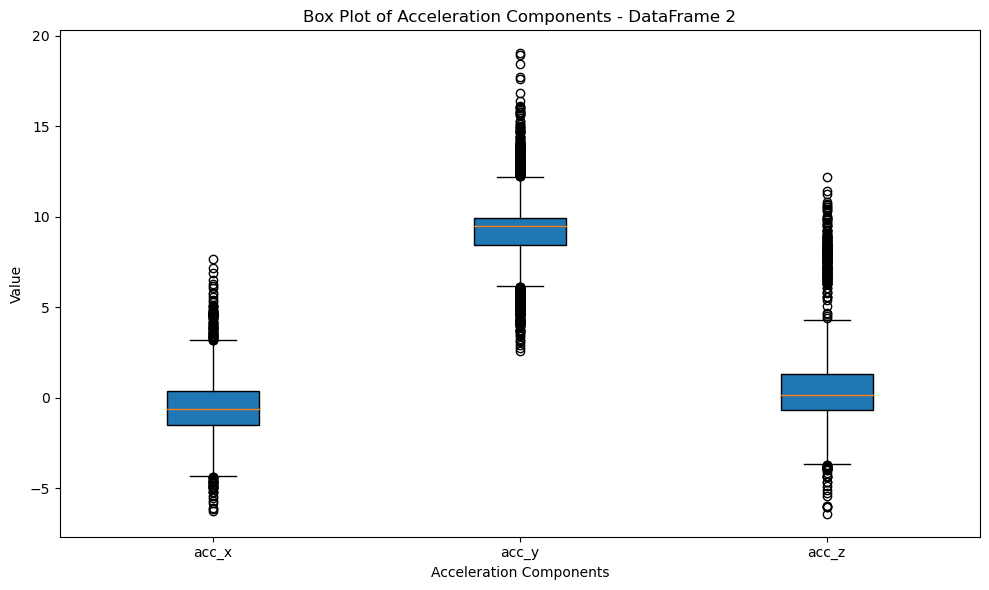

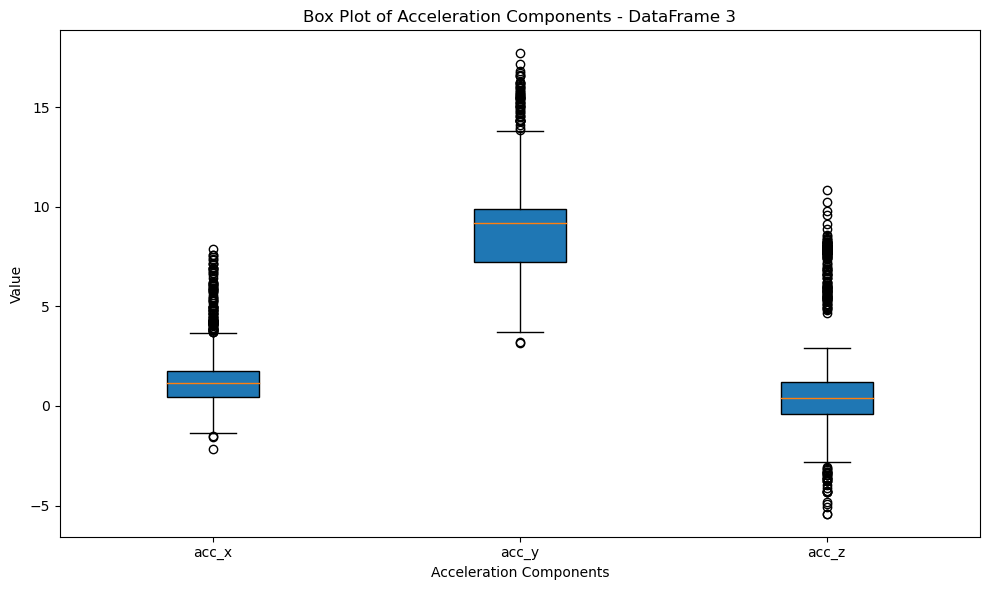

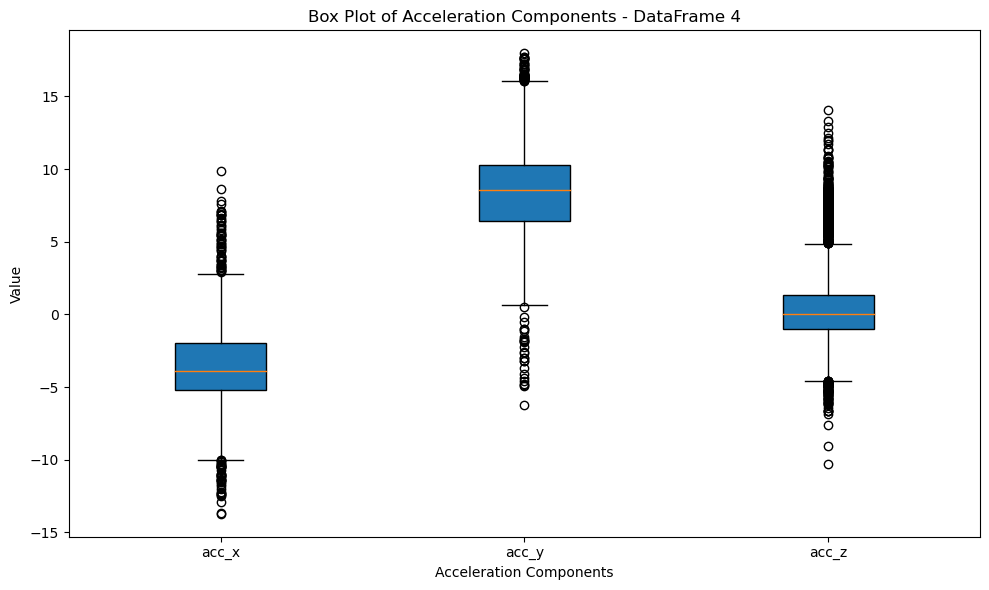

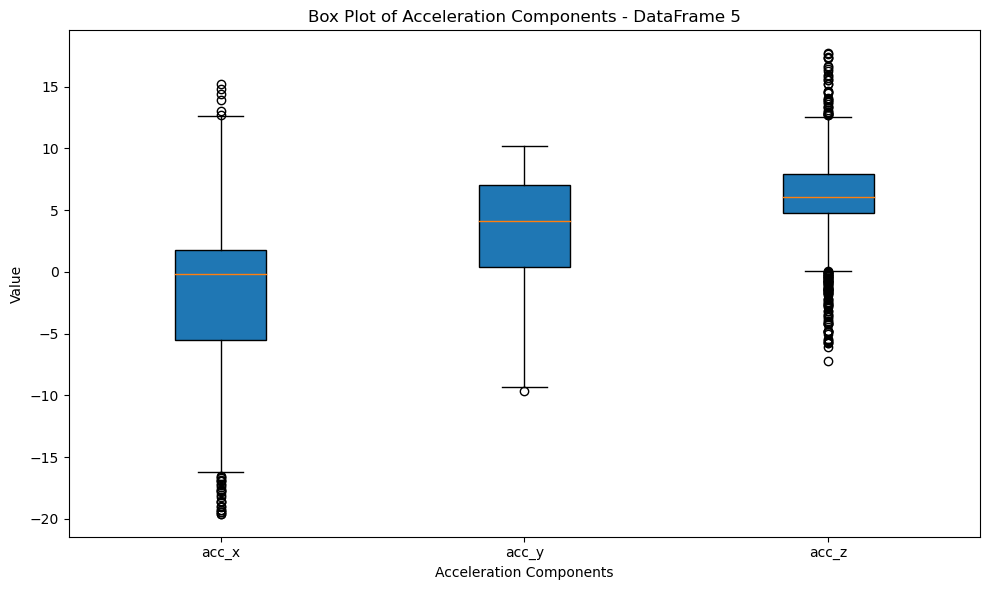

...

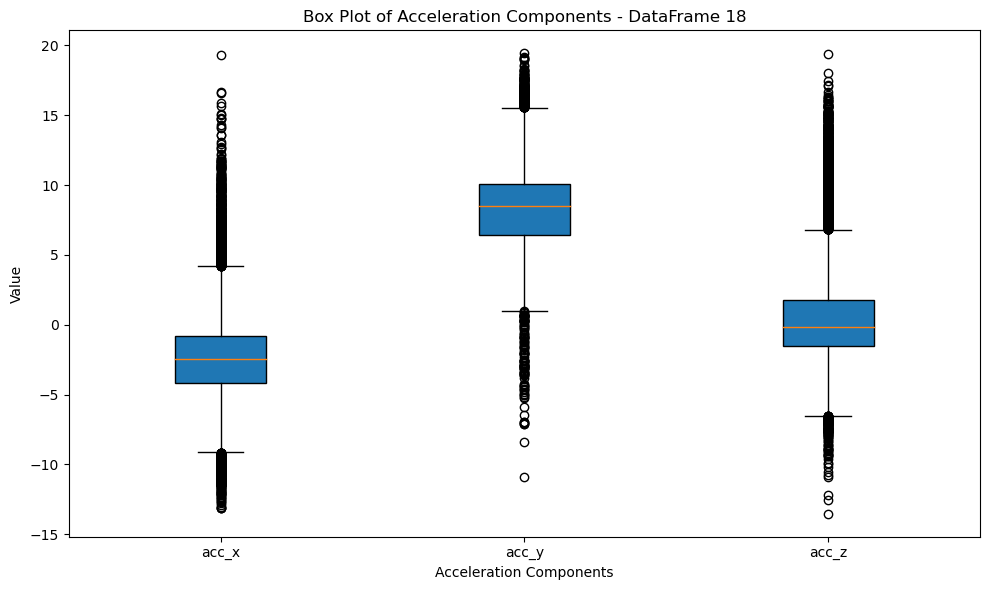

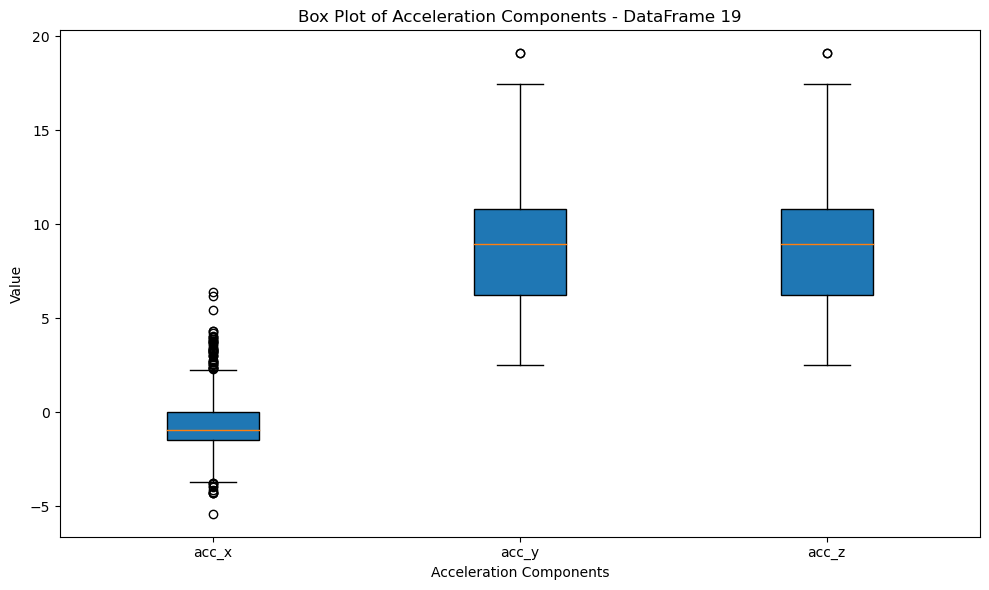

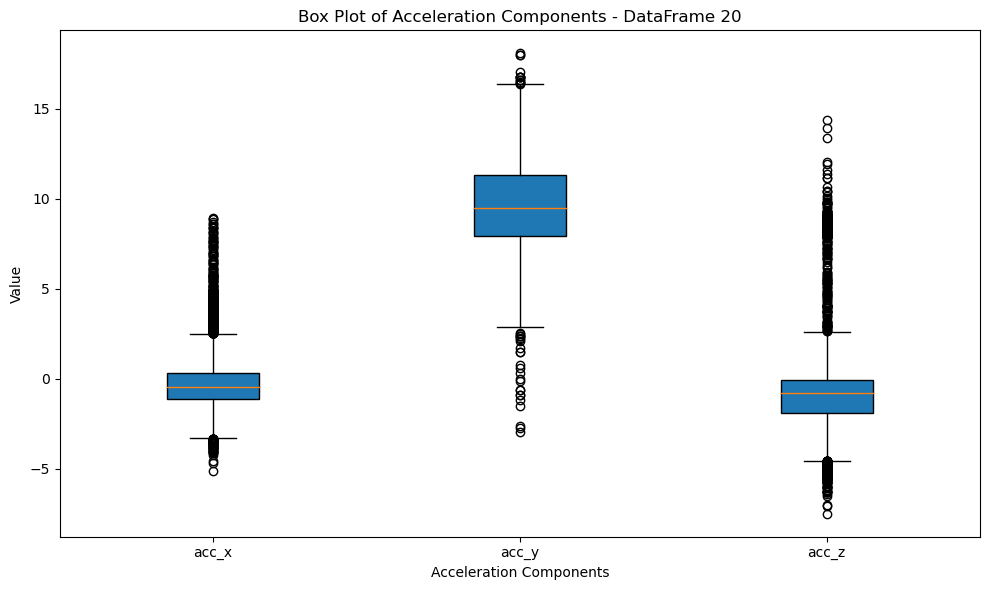

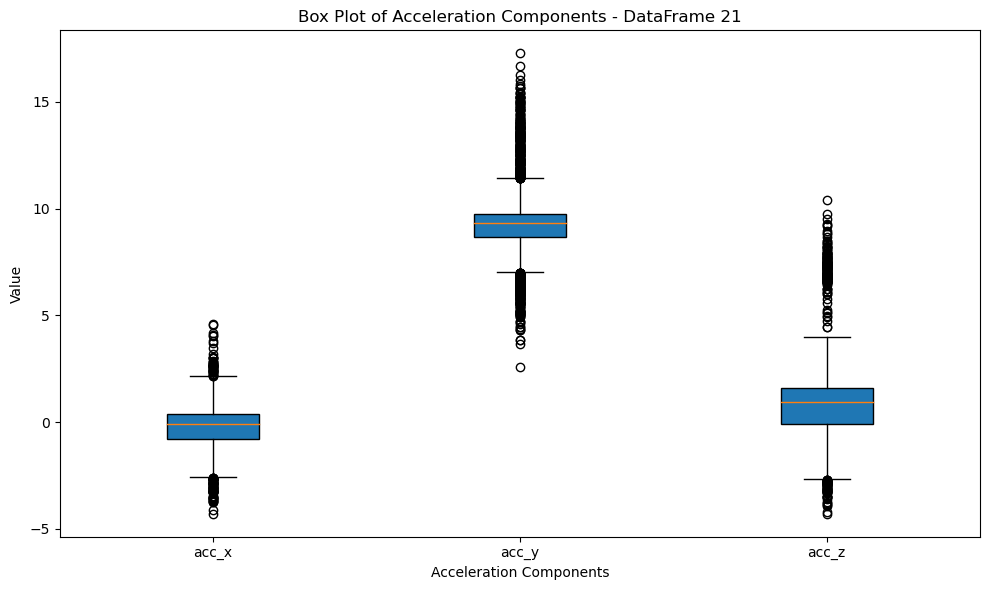

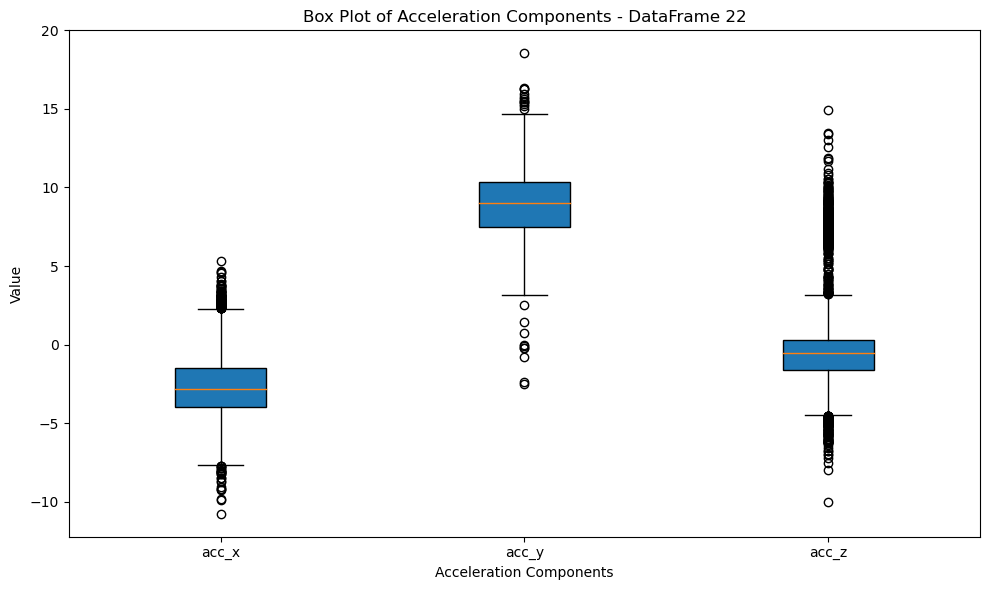

In [9]:
import matplotlib.pyplot as plt

for i, df in enumerate(dfs_uncleaned):
    plt.figure(figsize=(10, 6))
    plt.boxplot([df['acc_x'], df['acc_y'], df['acc_z']], vert=True, patch_artist=True, labels=['acc_x', 'acc_y', 'acc_z'])
    plt.xlabel('Acceleration Components')
    plt.ylabel('Value')
    plt.title(f'Box Plot of Acceleration Components - DataFrame {i+1}')
    plt.tight_layout()
    plt.show()


# check how the plots look vs time


/Users/nigel/anaconda3/lib/python3.11/site-packages/pandas/plotting/_matplotlib/core.py:509: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = self.plt.figure(figsize=self.figsize)


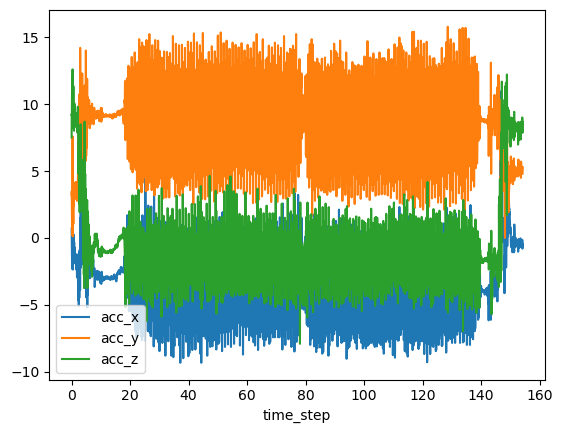

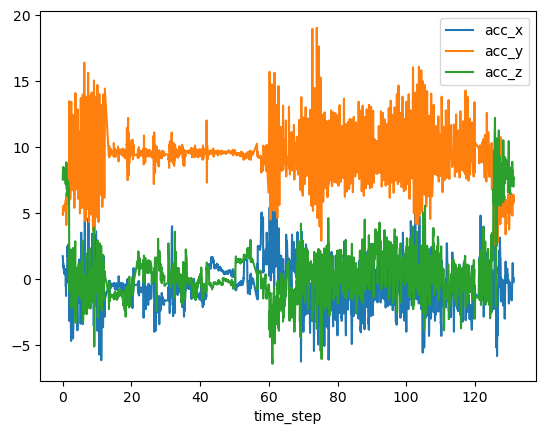

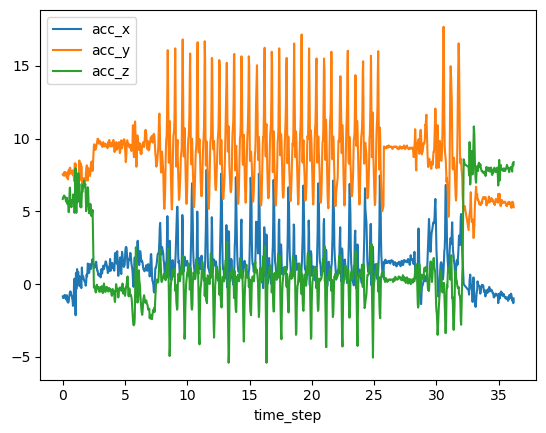

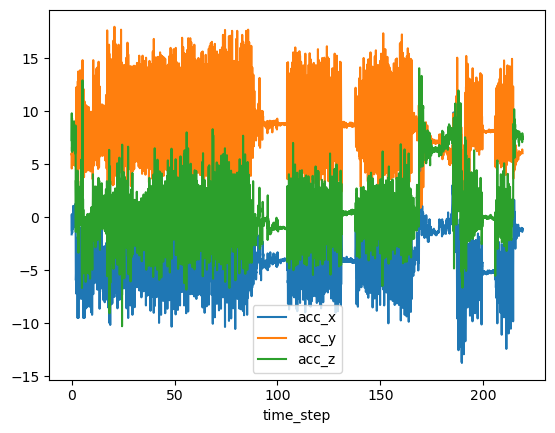

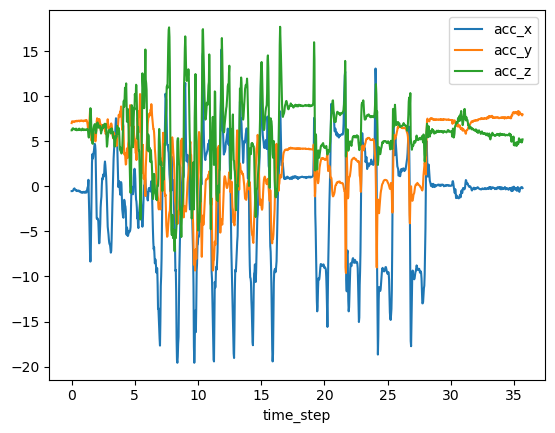

...

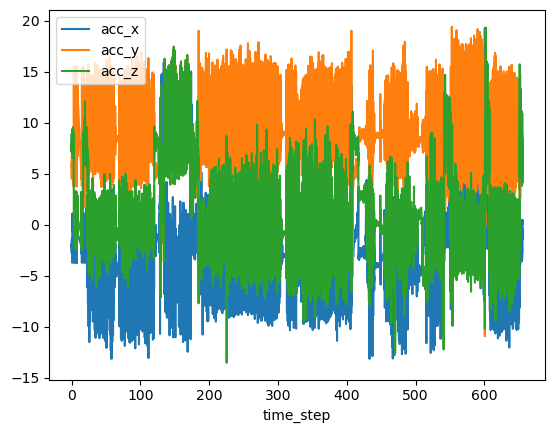

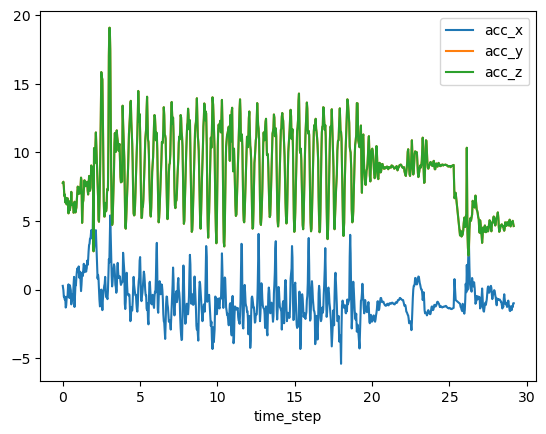

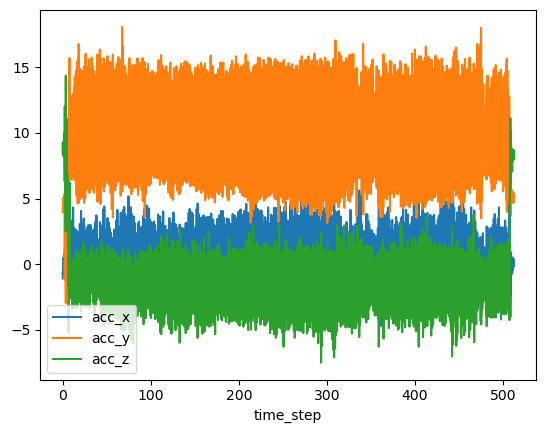

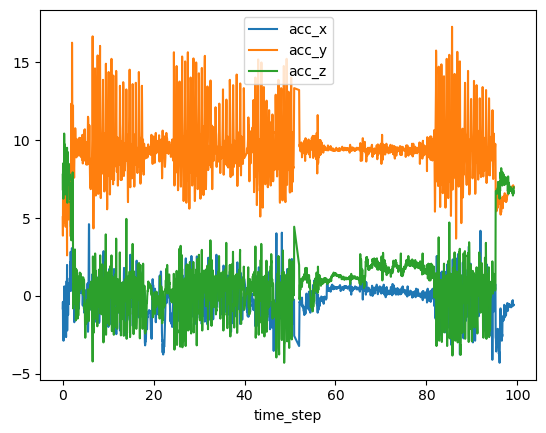

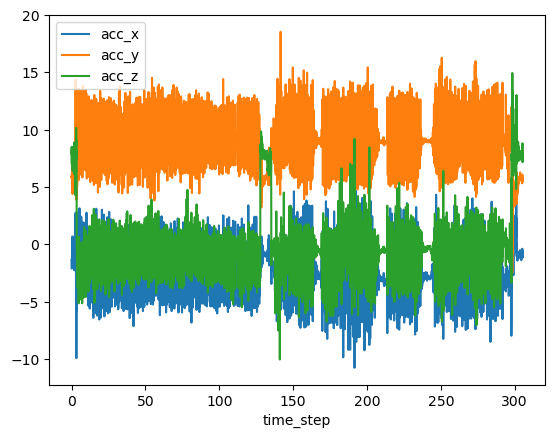

In [10]:
for df in dfs_uncleaned:
    df.plot(x='time_step',y=['acc_x','acc_y','acc_z'])

/Users/nigel/anaconda3/lib/python3.11/site-packages/pandas/plotting/_matplotlib/core.py:509: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = self.plt.figure(figsize=self.figsize)


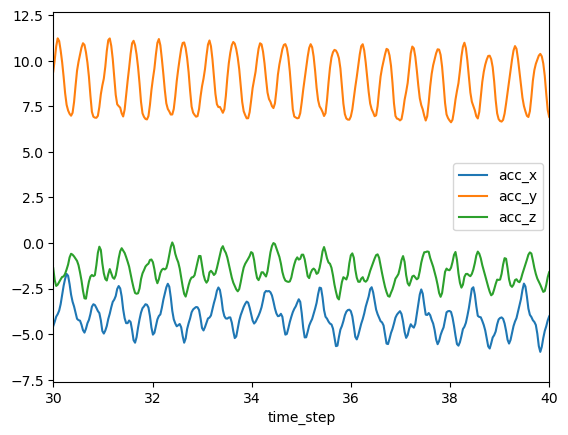

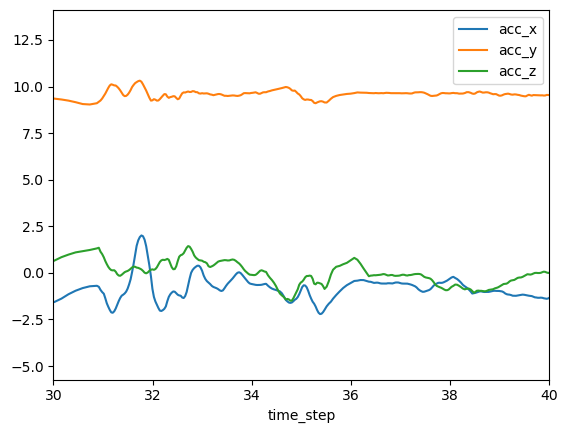

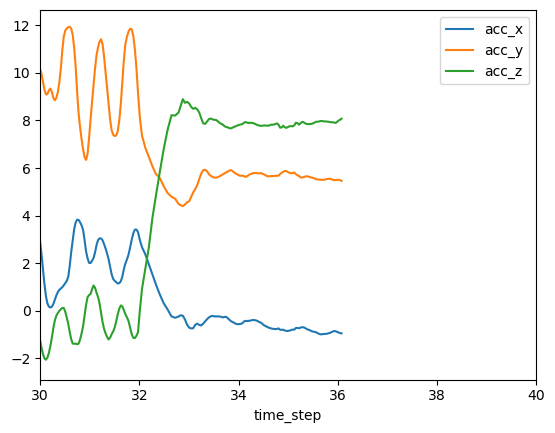

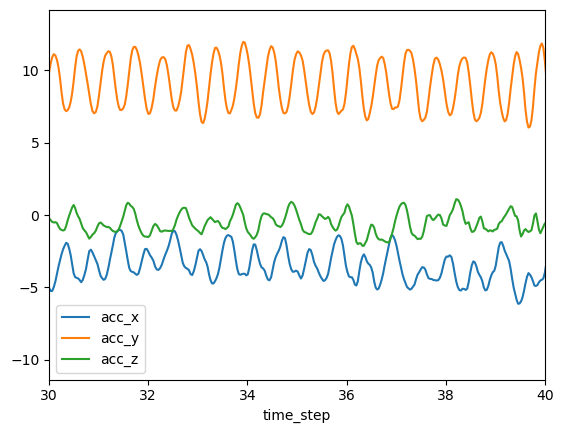

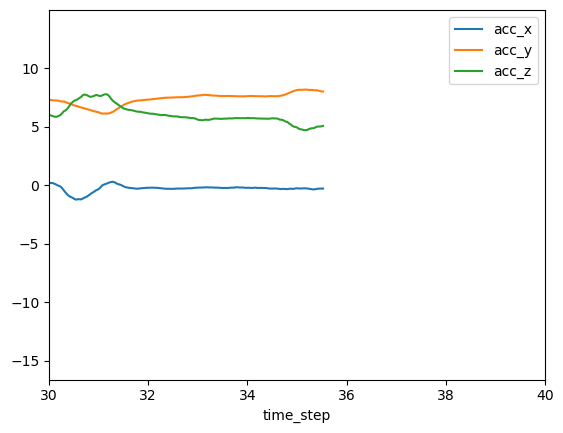

...

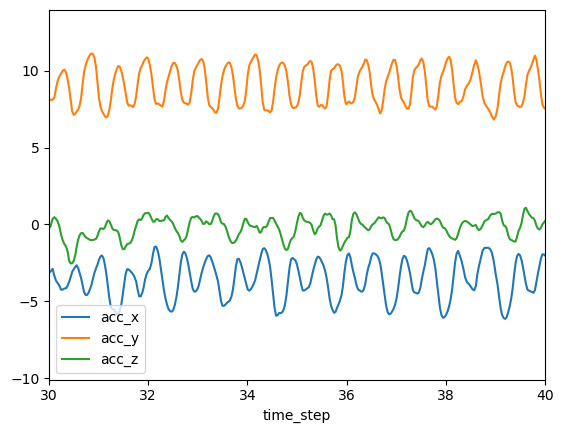

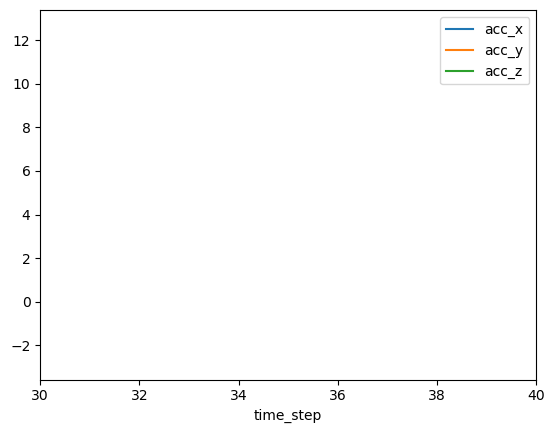

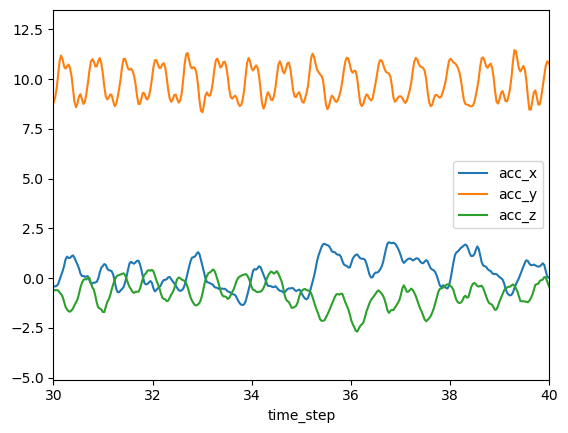

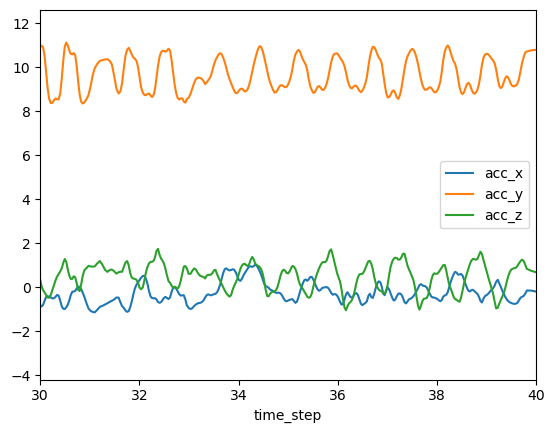

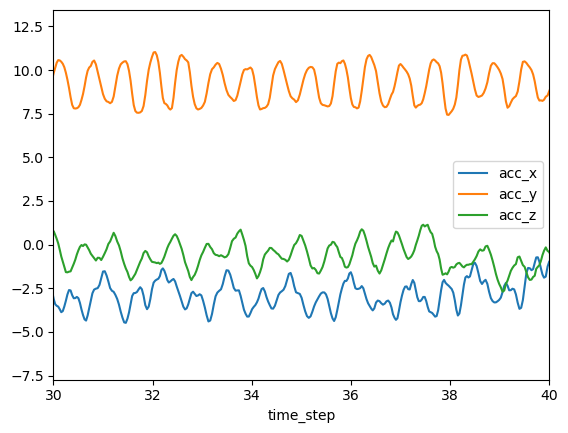

In [11]:
for df in dfs_uncleaned:
    df=df.rolling(window=10).mean()
    df.plot(x='time_step',y=['acc_x','acc_y','acc_z'])
    plt.xlim(30,40)

# cleaning the data

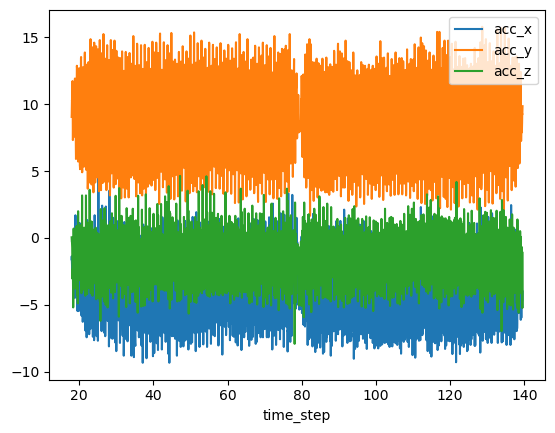

In [12]:
dfs_cleaned = []
df1 = df1[(df1['time_step'] < 0) | (df1['time_step'] > 18)]
df1 = df1[(df1['time_step'] < 139.5)]
df1.plot( x = 'time_step',y=['acc_x','acc_y','acc_z'])
dfs_cleaned.append(df1)

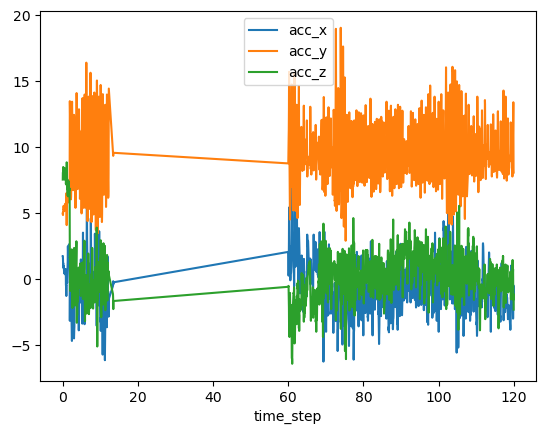

In [13]:
df2 = df2[(df2['time_step'] < 13.5) | (df2['time_step'] > 60)]
df2 = df2[df2['time_step'] < 120]
df2.plot( x = 'time_step',y=['acc_x','acc_y','acc_z'])
dfs_cleaned.append(df2)

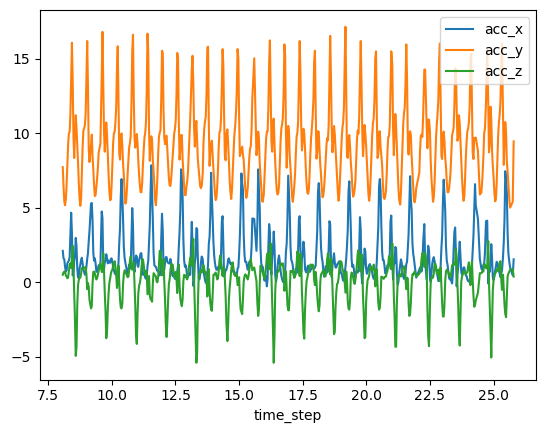

In [14]:
df3 = df3[df3['time_step'] > 8]
df3 = df3[df3['time_step'] <25.8]
df3.plot( x = 'time_step',y=['acc_x','acc_y','acc_z'])
dfs_cleaned.append(df3)

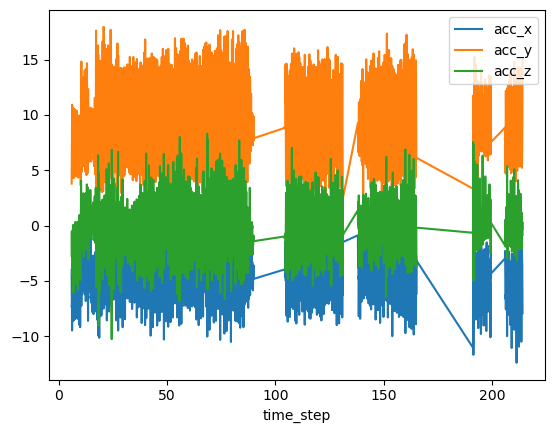

In [15]:
df4 = df4[df4['time_step'] > 6]
df4 = df4[(df4['time_step'] < 90) | (df4['time_step'] > 104)]
df4 = df4[(df4['time_step'] < 131.125) | (df4['time_step'] > 138)]
df4 = df4[(df4['time_step'] < 165) | (df4['time_step'] > 191)]
df4 = df4[(df4['time_step'] < 199.5) | (df4['time_step'] > 205.8)]
df4 = df4[df4['time_step'] < 214]
df4.plot( x = 'time_step',y=['acc_x','acc_y','acc_z'])
dfs_cleaned.append(df4)

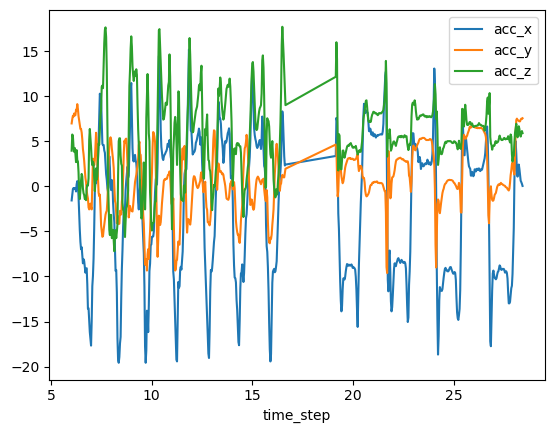

In [16]:
df5 = df5[df5['time_step'] < 28.45]
df5 = df5[df5['time_step'] > 6]
df5 = df5[(df5['time_step'] < 16.65) | (df5['time_step'] > 19.120)]
df5.plot( x = 'time_step',y=['acc_x','acc_y','acc_z'])
dfs_cleaned.append(df5)

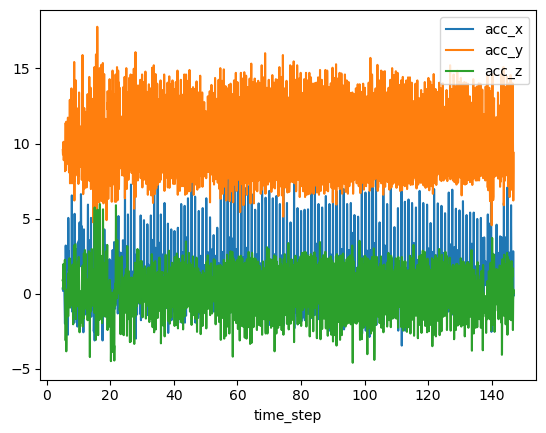

In [17]:
df6 = df6[df6['time_step'] > 5]
df6 = df6[df6['time_step'] < 147]
df6.plot( x = 'time_step',y=['acc_x','acc_y','acc_z'])
dfs_cleaned.append(df6)

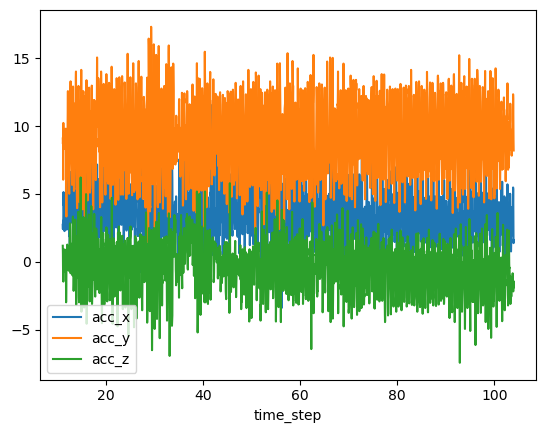

In [18]:
df7 = df7[df7['time_step'] > 11]
df7 = df7[df7['time_step'] < 104]
df7.plot( x = 'time_step',y=['acc_x','acc_y','acc_z'])
dfs_cleaned.append(df7)

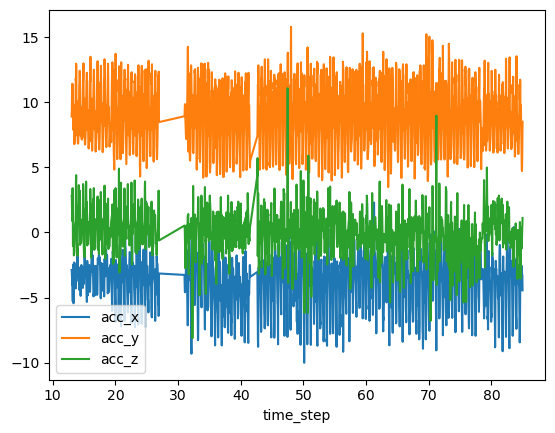

In [19]:
df8 = df8[df8['time_step'] > 13]
df8 = df8[(df8['time_step'] < 27) | (df8['time_step'] > 31)]
df8 = df8[df8['time_step'] < 85]
df8.plot( x = 'time_step',y=['acc_x','acc_y','acc_z'])
dfs_cleaned.append(df8)

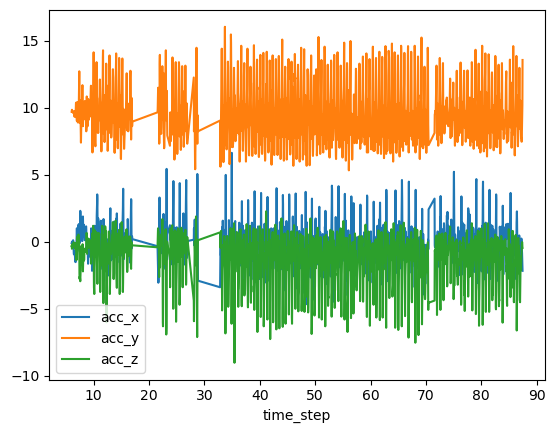

In [20]:
df9 = df9[df9['time_step'] > 6]
df9 = df9[(df9['time_step'] < 17) | (df8['time_step'] > 21.5)]
df9.plot( x = 'time_step',y=['acc_x','acc_y','acc_z'])
dfs_cleaned.append(df9)


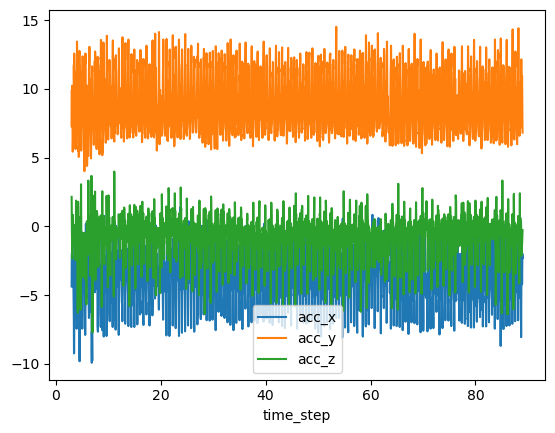

In [21]:
df10 = df10[df10['time_step'] > 3]
df10 = df10[df10['time_step'] < 89]
df10.plot( x = 'time_step',y=['acc_x','acc_y','acc_z'])
dfs_cleaned.append(df10)

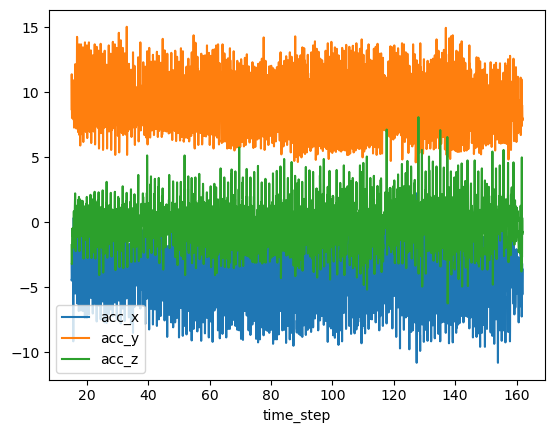

In [22]:
df11 = df11[df11['time_step'] > 15]
#df10 = df10[(df10['time_step'] < 17) | (df8['time_step'] > 21.5)]
df11 = df11[df11['time_step'] < 162]
df11.plot( x = 'time_step',y=['acc_x','acc_y','acc_z'])
dfs_cleaned.append(df11)

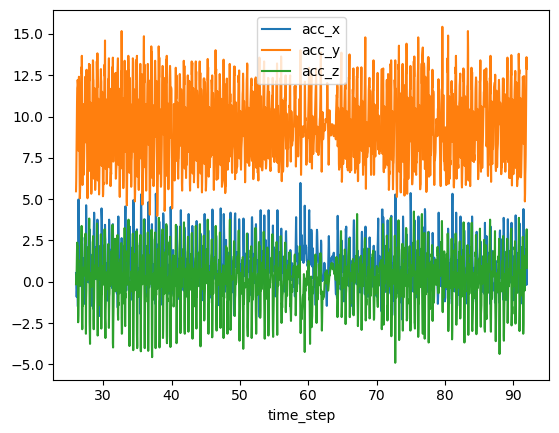

In [23]:
df12 = df12[df12['time_step'] > 26]
#df10 = df10[(df10['time_step'] < 17) | (df8['time_step'] > 21.5)]
df12 = df12[df12['time_step'] < 92]
df12.plot( x = 'time_step',y=['acc_x','acc_y','acc_z'])
dfs_cleaned.append(df12)

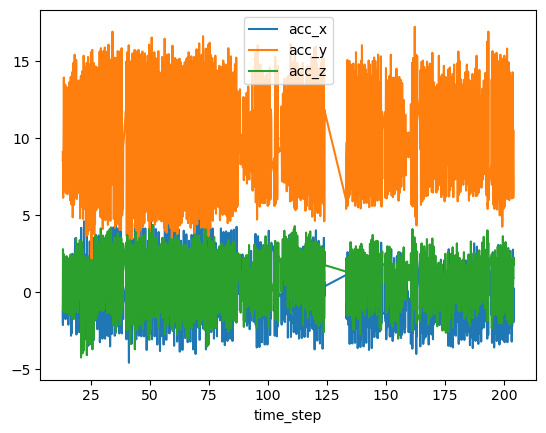

In [24]:
df13 = df13[df13['time_step'] > 13]
df13 = df13[(df13['time_step'] < 124) | (df13['time_step'] > 133)]
df13 = df13[df13['time_step'] < 204]
df13.plot( x = 'time_step',y=['acc_x','acc_y','acc_z'])
dfs_cleaned.append(df13)

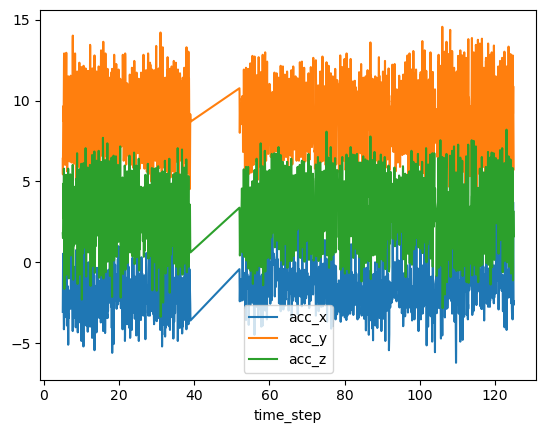

In [25]:
df14 = df14[df14['time_step'] > 5]
df14 = df14[(df14['time_step'] < 39) | (df14['time_step'] > 52)]
df14 = df14[df14['time_step'] < 125]
df14.plot( x = 'time_step',y=['acc_x','acc_y','acc_z'])
dfs_cleaned.append(df14)

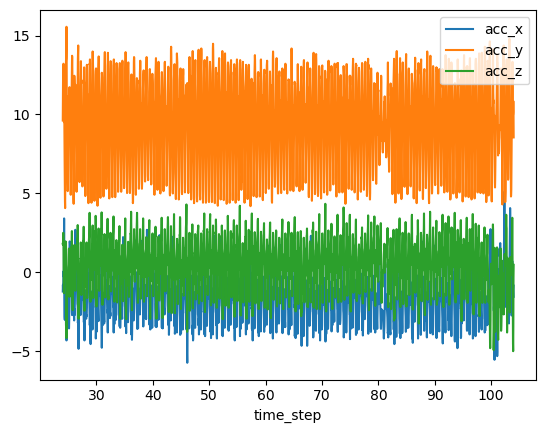

In [26]:
df15 = df15[df15['time_step'] > 24]
#df15 = df15[(df15['time_step'] < 39) | (df14['time_step'] > 52)]
df15 = df15[df15['time_step'] < 104]
df15.plot( x = 'time_step',y=['acc_x','acc_y','acc_z'])
dfs_cleaned.append(df15)

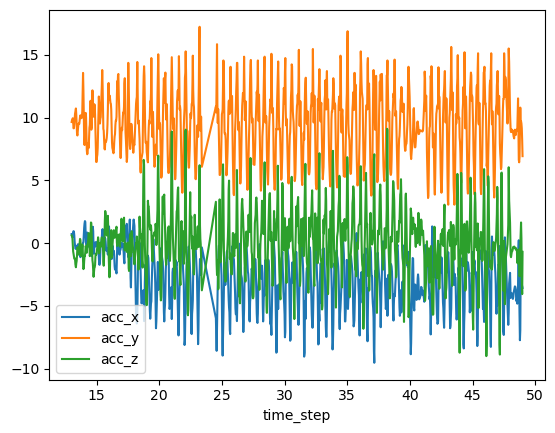

In [27]:
df16 = df16[df16['time_step'] > 13]
#df15 = df15[(df15['time_step'] < 39) | (df14['time_step'] > 52)]
df16 = df16[df16['time_step'] < 49]
df16.plot( x = 'time_step',y=['acc_x','acc_y','acc_z'])
dfs_cleaned.append(df16)

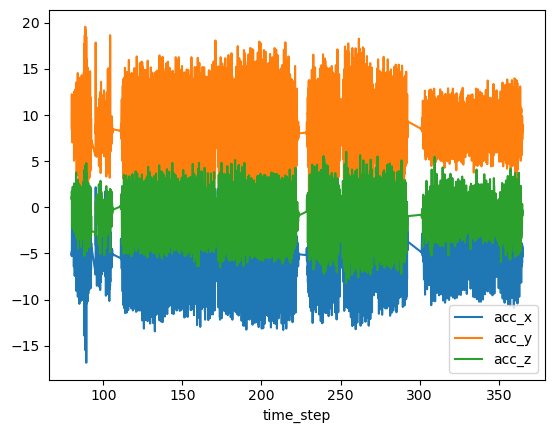

In [28]:
df17 = df17[df17['time_step'] > 80]
df17 = df17[(df17['time_step'] < 92.5) | (df17['time_step'] > 95)]
df17 = df17[(df17['time_step'] < 106) | (df17['time_step'] > 111)]
df17 = df17[(df17['time_step'] < 223.5) | (df17['time_step'] > 228.5)]
df17 = df17[(df17['time_step'] < 292.5) | (df17['time_step'] > 301)]
df17 = df17[df17['time_step'] < 365]
df17.plot( x = 'time_step',y=['acc_x','acc_y','acc_z'])
dfs_cleaned.append(df17)

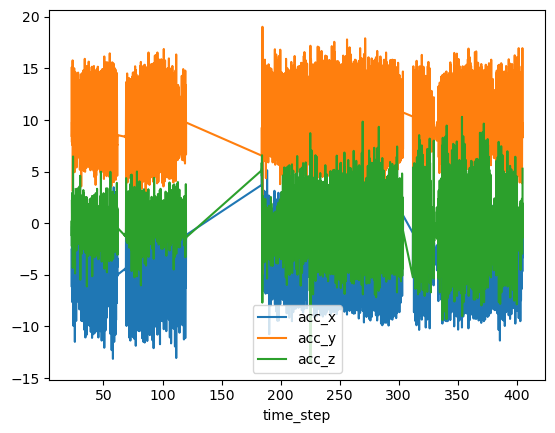

In [29]:
df18 = df18[df18['time_step'] > 23]
df18 = df18[(df18['time_step'] < 62) | (df18['time_step'] > 68)]
df18 = df18[(df18['time_step'] < 120) | (df18['time_step'] > 184)]
df18 = df18[(df18['time_step'] < 304) | (df18['time_step'] > 312)]
df18 = df18[df18['time_step'] < 405]
df18.plot( x = 'time_step',y=['acc_x','acc_y','acc_z'])
dfs_cleaned.append(df18)

<Axes: xlabel='time_step'>

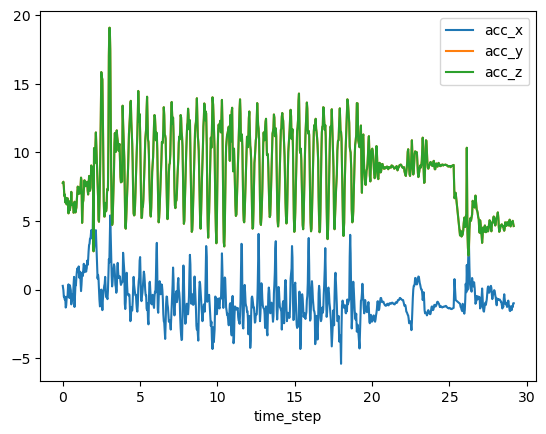

In [30]:
#df19 is not cleaned and not appended because there is something wrong with the data. the z acceleration seems to 
#be reading the y acceleration.
#I noticed this because this has happened in my own activity data before where for some reason my heartrate is 
#locking on to my cadence (steps per minute)and their graph will be identical.
df19.plot( x = 'time_step',y=['acc_x','acc_y','acc_z'])

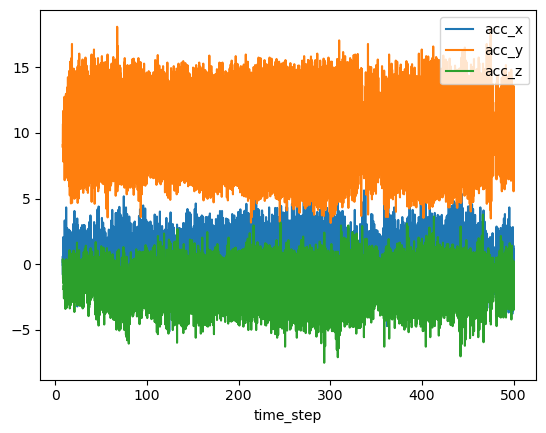

In [31]:
df20 = df20[df20['time_step'] > 8]
df20 = df20[df20['time_step'] < 500]
df20.plot( x = 'time_step',y=['acc_x','acc_y','acc_z'])
dfs_cleaned.append(df20)

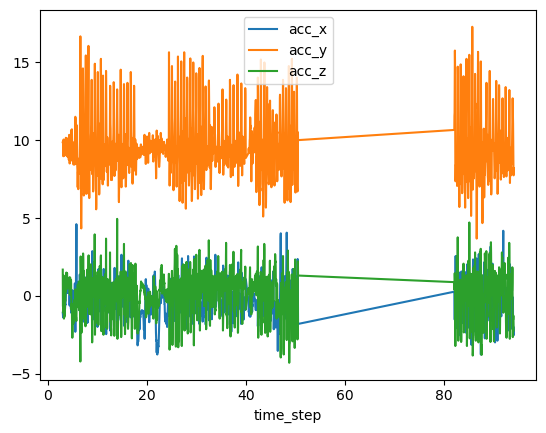

In [32]:
df21 = df21[df21['time_step'] > 3]
df21 = df21[df21['time_step'] < 94]
df21 = df21[(df21['time_step'] < 50.5) | (df21['time_step'] > 82)]
df21.plot( x = 'time_step',y=['acc_x','acc_y','acc_z'])
dfs_cleaned.append(df21)

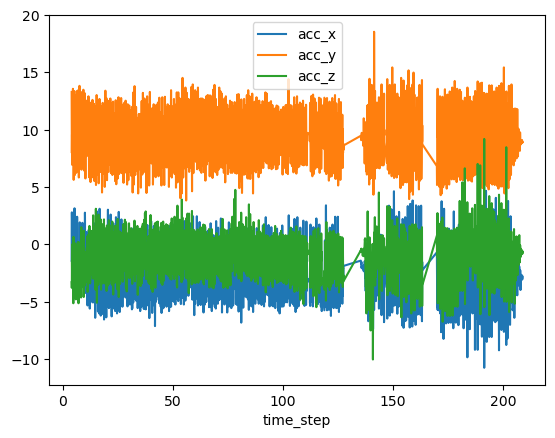

In [33]:
df22 = df22[df22['time_step'] > 4]
df22 = df22[df22['time_step'] < 209]
df22 = df22[(df22['time_step'] < 127.6) | (df22['time_step'] > 135.4)]
df22 = df22[(df22['time_step'] < 163.5) | (df22['time_step'] > 170)]
df22.plot( x = 'time_step',y=['acc_x','acc_y','acc_z'])
dfs_cleaned.append(df22)


      time_step   acc_x    acc_y     acc_z  target  magnitude
584       18.01 -1.6072   9.0439  0.040861       1   8.324538
585       18.04 -1.3757   9.2755 -0.149820       1   8.154205
586       18.07 -1.6889   9.8066 -0.299650       1   8.001749
587       18.10 -2.0703  10.3110 -0.299650       1   7.929550
588       18.13 -2.1384  10.2290 -0.531190       1   8.154613
...         ...     ...      ...       ...     ...        ...
4606     139.36 -4.6718   8.6217 -2.492500       1  10.742633
4607     139.39 -4.0589   9.2755 -4.562800       1  10.280930
4608     139.42 -3.9499   9.2346 -5.243800       1  10.417394
4609     139.45 -4.6718   9.5342 -2.833000       1  11.157279
4610     139.48 -5.1757   9.8475 -1.116900       1  11.406159

[4027 rows x 6 columns]


(20.0, 40.0)

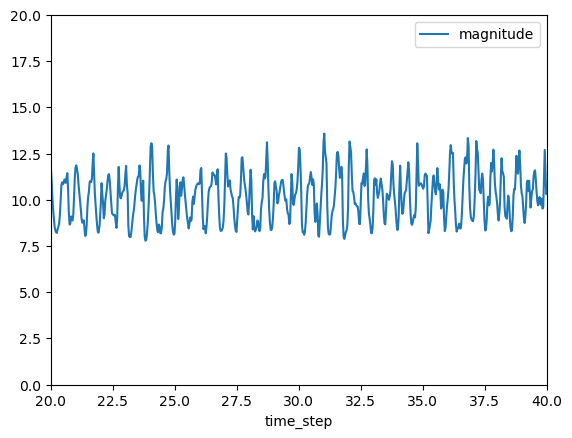

In [34]:
# magnitude before mean is subtracted
df1["magnitude"] = np.sqrt(df1["acc_x"]**2 + df["acc_y"]**2 + df["acc_z"]**2)
print(df1)
df1.plot(x='time_step',y='magnitude')
plt.ylim(0,20)
plt.xlim(20,40)
    
    

In [35]:
#get the magnitude of acceleration
dfs_cleaned_magnitude = []
for df in dfs_cleaned:
    df["magnitude"] = np.sqrt(df["acc_x"]**2 + df["acc_y"]**2 + df["acc_z"]**2)
    df["magnitude"] = df["magnitude"] - df["magnitude"].mean() #subtracting the mean to remove constant effect such as gravity
    dfs_cleaned_magnitude.append(df)

      time_step   acc_x    acc_y     acc_z  target  magnitude
584       18.01 -1.6072   9.0439  0.040861       1  -0.961305
585       18.04 -1.3757   9.2755 -0.149820       1  -0.768834
586       18.07 -1.6889   9.8066 -0.299650       1  -0.191515
587       18.10 -2.0703  10.3110 -0.299650       1   0.374063
588       18.13 -2.1384  10.2290 -0.531190       1   0.316626
...         ...     ...      ...       ...     ...        ...
4606     139.36 -4.6718   8.6217 -2.492500       1  -0.029090
4607     139.39 -4.0589   9.2755 -4.562800       1   0.958352
4608     139.42 -3.9499   9.2346 -5.243800       1   1.183362
4609     139.45 -4.6718   9.5342 -2.833000       1   0.841753
4610     139.48 -5.1757   9.8475 -1.116900       1   1.033730

[4027 rows x 6 columns]


(20.0, 40.0)

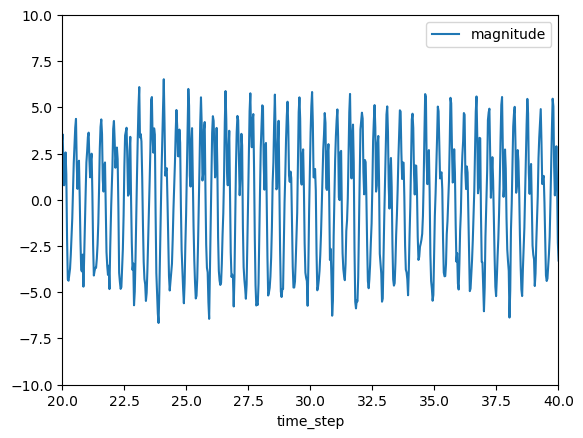

In [36]:
#magnitude after mean is subtracted
print(dfs_cleaned_magnitude[0])
dfs_cleaned_magnitude[0].plot(x='time_step',y='magnitude')
plt.ylim(-10,10)
plt.xlim(20,40)


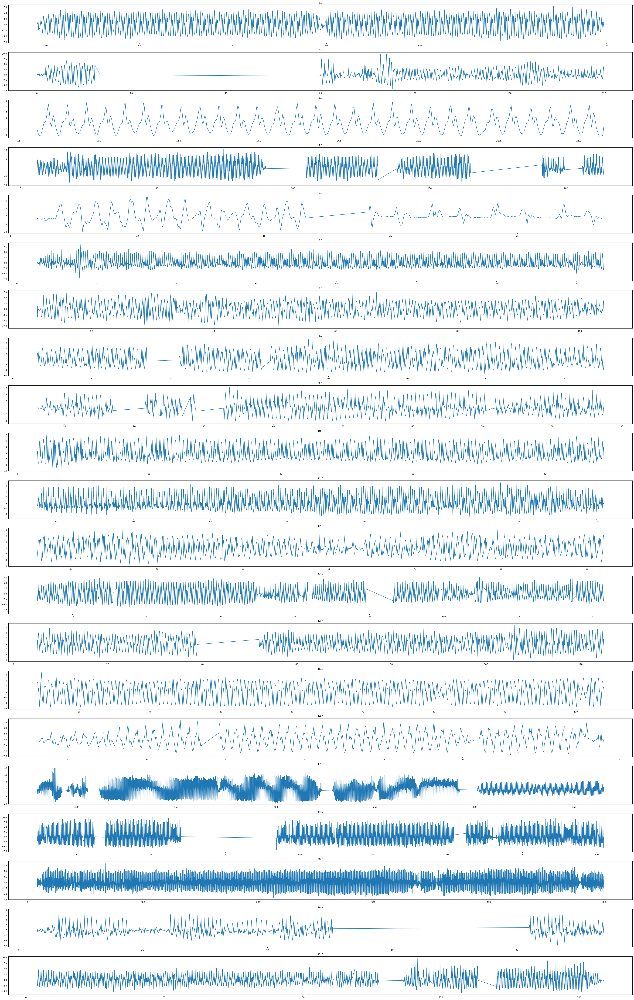

In [37]:
#plot magnitudes
import matplotlib.pyplot as plt
num_plots = len(dfs_cleaned_magnitude)
fig, axes = plt.subplots(nrows=num_plots, figsize=(40, 3 * num_plots))
for i, df in enumerate(dfs_cleaned_magnitude):
    time_step = df['time_step']
    magnitude = df['magnitude']
    target = df['target'].mean()
    ax = axes[i] if num_plots > 1 else axes
    ax.plot(time_step, magnitude)
    ax.set_title(target)
plt.tight_layout()
plt.show()




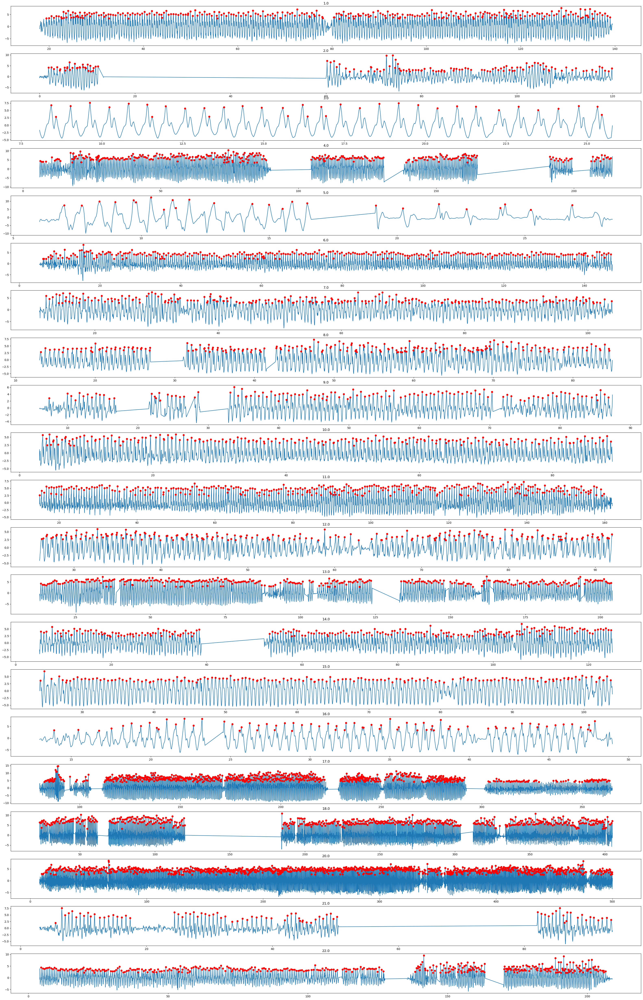

In [38]:
#plot magnitudes and drop dataframes with steps(peaks) less than 100
dfs_lowdata_dropped = []
num_plots = len(dfs_cleaned_magnitude)
fig, axes = plt.subplots(nrows=num_plots, figsize=(40, 3 * num_plots))

for i, df in enumerate(dfs_cleaned_magnitude):
    std_dev = np.std(df['magnitude']) # Compute the standard deviation
    peaks, _ = find_peaks(df['magnitude'], height=std_dev)  # Use std_dev as the height threshold to be identified as peak
    df = df.reset_index(drop=True) # Reset the index of the DataFrame
    target = df['target'].mean()
    
    peak_magnitudes = df['magnitude'][peaks] 
    peak_times = df['time_step'][peaks]
    ax = axes[i] if num_plots > 1 else axes
    ax.plot(df['time_step'], df['magnitude'], label='Magnitude')
    ax.plot(peak_times, peak_magnitudes, 'ro', label='Peaks')
    ax.set_title(target)
    
    if peaks.shape[0] > 100:
        dfs_lowdata_dropped.append(df) #remove if the number of steps is less than 100


In [39]:
#keep 2100 data points
for df in dfs_lowdata_dropped:
    print(df.shape[0])
for i, df in enumerate(dfs_lowdata_dropped):
    dfs_lowdata_dropped[i] = df[:2100]
    
    
    
    

4027
2288
4978
4667
2969
2196
2269
2818
4784
2122
5653
3472
2643
8752
9736
16298
6054


In [40]:
for df in dfs_lowdata_dropped:
    print(df.shape[0])

2100
2100
2100
2100
2100
2100
2100
2100
2100
2100
2100
2100
2100
2100
2100
2100
2100


(60.0, 120.0)

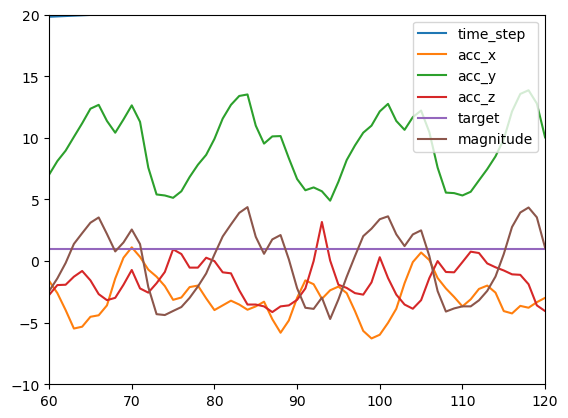

In [41]:
#finding optimal window and overlap
df = dfs_lowdata_dropped[0]
df.plot()
plt.ylim(-10,20)
plt.xlim(60,120)


In [42]:
#windowing operation
windowed_dfs=[]
for df in dfs_lowdata_dropped:
    window_size = 165
    overlap = 0.25
    stride = int(window_size * overlap)
    columns_to_agg = ['acc_x','acc_y','acc_z','magnitude', 'target']
    agg_funcs = {'acc_x':['mean','min','max','std','var','skew','kurt','sem'],'acc_y':['mean','min','max','std','var','skew','kurt','sem'],'acc_z':['mean','min','max','std','var','skew','kurt','sem'],'magnitude': ['mean','min','max','std','var','skew','kurt','sem'],'target': 'mean'}
    windowed_df = df[columns_to_agg].rolling(window=window_size, min_periods=window_size, center=False).agg(agg_funcs)[window_size-1::stride]
    columns = ['AccX_Mean','AccX_Min', 'AccX_Max', 'AccX_Std','AccX_Var','AccX_Skew','AccX_Kurtosis','AccX_Sem','AccY_Mean','AccY_Min', 'AccY_Max', 'AccY_Std','AccY_Var','AccY_Skew','AccY_Kurtosis','AccY_Sem','AccZ_Mean','AccZ_Min', 'AccZ_Max', 'AccZ_Std','AccZ_Var','AccZ_Skew','AccZ_Kurtosis','AccZ_Sem','Mag_Mean', 'Mag_Min', 'Mag_Max', 'Mag_Std','Mag_Var','Mag_Skew','Mag_Kurtosis','Mag_Sem','Target']
    windowed_df.columns = columns
    windowed_dfs.append(windowed_df)
    print(windowed_df.shape[0])
windowed_dfs[0].head()

48
48
48
48
48
48
48
48
48
48
48
48
48
48
48
48
48


,AccX_Mean,AccX_Min,AccX_Max,AccX_Std,AccX_Var,AccX_Skew,AccX_Kurtosis,AccX_Sem,AccY_Mean,AccY_Min,...,AccZ_Sem,Mag_Mean,Mag_Min,Mag_Max,Mag_Std,Mag_Var,Mag_Skew,Mag_Kurtosis,Mag_Sem,Target
164,-2.813884,-7.4367,1.6889,1.699139,2.887072,-0.002677,0.390708,0.132680,9.102370,3.6775,...,0.131195,-0.210069,-5.708414,4.377881,2.583566,6.674816,-0.146196,-1.088966,0.201743,1.0
205,-3.010181,-7.6546,1.6889,1.995721,3.982902,-0.125865,-0.157565,0.155840,9.210583,3.4051,...,0.133996,-0.040785,-6.666216,6.522805,3.132247,9.810974,-0.146351,-1.139855,0.244587,1.0
246,-2.959413,-7.6955,4.5628,2.279860,5.197764,0.223195,0.516936,0.178027,9.099227,3.4051,...,0.132110,-0.113579,-6.666216,6.522805,3.378384,11.413482,-0.085803,-1.285072,0.263808,1.0
287,-2.785897,-7.6955,4.5628,2.332105,5.438715,0.125001,0.414377,0.182107,9.147357,3.4051,...,0.140686,-0.091947,-6.666216,6.522805,3.522242,12.406189,-0.070988,-1.306085,0.275041,1.0
328,-2.780036,-7.6955,4.5628,2.359946,5.569346,0.161355,0.329315,0.184281,9.155456,3.4051,...,0.147962,-0.057177,-6.666216,6.522805,3.673151,13.492039,-0.093141,-1.364263,0.286825,1.0


In [43]:
# Concatenate the DataFrames into a single DataFrame and split the data 
combined_df = pd.concat(windowed_dfs, ignore_index=True)
X = combined_df[['AccX_Mean','AccY_Mean','AccZ_Mean','Mag_Mean', 'Mag_Min', 'Mag_Max', 'Mag_Std','Mag_Var','Mag_Skew','Mag_Kurtosis','Mag_Sem']]
y = combined_df["Target"]  
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=0)
combined_df.head(50)
combined_df

,AccX_Mean,AccX_Min,AccX_Max,AccX_Std,AccX_Var,AccX_Skew,AccX_Kurtosis,AccX_Sem,AccY_Mean,AccY_Min,...,AccZ_Sem,Mag_Mean,Mag_Min,Mag_Max,Mag_Std,Mag_Var,Mag_Skew,Mag_Kurtosis,Mag_Sem,Target
0,-2.813884,-7.4367,1.6889,1.699139,2.887072,-0.002677,0.390708,0.132680,9.102370,3.6775,...,0.131195,-0.210069,-5.708414,4.377881,2.583566,6.674816,-0.146196,-1.088966,0.201743,1.0
1,-3.010181,-7.6546,1.6889,1.995721,3.982902,-0.125865,-0.157565,0.155840,9.210583,3.4051,...,0.133996,-0.040785,-6.666216,6.522805,3.132247,9.810974,-0.146351,-1.139855,0.244587,1.0
2,-2.959413,-7.6955,4.5628,2.279860,5.197764,0.223195,0.516936,0.178027,9.099227,3.4051,...,0.132110,-0.113579,-6.666216,6.522805,3.378384,11.413482,-0.085803,-1.285072,0.263808,1.0
3,-2.785897,-7.6955,4.5628,2.332105,5.438715,0.125001,0.414377,0.182107,9.147357,3.4051,...,0.140686,-0.091947,-6.666216,6.522805,3.522242,12.406189,-0.070988,-1.306085,0.275041,1.0
4,-2.780036,-7.6955,4.5628,2.359946,5.569346,0.161355,0.329315,0.184281,9.155456,3.4051,...,0.147962,-0.057177,-6.666216,6.522805,3.673151,13.492039,-0.093141,-1.364263,0.286825,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
811,-2.792748,-6.1700,2.4517,1.607642,2.584513,0.804790,0.681526,0.125536,9.174906,6.2109,...,0.109510,-0.067169,-3.350884,4.879079,1.793360,3.216142,0.861720,0.393631,0.140038,22.0
812,-2.829232,-5.9385,2.4517,1.652443,2.730569,1.013893,0.810645,0.129034,9.167826,5.5571,...,0.108161,-0.045407,-2.727317,4.879079,1.694277,2.870573,0.824653,0.251380,0.132301,22.0
813,-2.808511,-5.9385,1.9477,1.625271,2.641506,0.842707,0.321437,0.126912,9.172609,5.5571,...,0.107970,-0.051216,-2.813090,4.296808,1.690163,2.856652,0.757027,0.025194,0.131980,22.0
814,-2.813137,-5.9385,1.8387,1.625958,2.643739,0.786597,0.295150,0.126966,9.149667,5.5571,...,0.109538,-0.063192,-2.986125,4.296808,1.706739,2.912957,0.755944,0.053829,0.133274,22.0


In [44]:
#Sanity check

In [45]:
X_train.shape

(489, 11)

In [46]:
X_test.shape

(327, 11)

In [47]:
y_train.shape

(489,)

In [48]:
y_test.shape

(327,)

# K-Neighbors Classifier

In [49]:
clf = KNeighborsClassifier(5,weights='distance')
fit = clf.fit(X_train, y_train)
predicted = fit.predict(X_test)
accuracy = accuracy_score(y_test, predicted)
report = classification_report(y_test, predicted)
print("Accuracy:", accuracy)
print("Classification Report:")
print(report)

confusion = confusion_matrix(y_test, predicted)
print("Confusion Matrix:")
print(confusion)


Accuracy: 0.8929663608562691
Classification Report:
              precision    recall  f1-score   support

         1.0       1.00      1.00      1.00        20
         2.0       1.00      0.74      0.85        19
         4.0       0.79      0.79      0.79        14
         6.0       0.67      0.94      0.78        17
         7.0       1.00      1.00      1.00        22
         8.0       0.87      0.80      0.83        25
         9.0       0.76      0.94      0.84        17
        10.0       0.86      0.95      0.90        20
        11.0       0.88      1.00      0.94        23
        12.0       0.89      0.65      0.76        26
        13.0       0.88      0.94      0.91        16
        14.0       0.93      1.00      0.96        13
        15.0       1.00      1.00      1.00        21
        17.0       0.91      0.80      0.85        25
        18.0       0.92      0.92      0.92        12
        20.0       0.90      0.86      0.88        21
        22.0       1.00      

In [50]:
#kfolds cross validation
clf = KNeighborsClassifier(n_neighbors=5, weights='distance')
k = 5  # Number of folds
scores = cross_val_score(clf, X_train, y_train, cv=k)
print("Cross-Validation Scores:", scores)
print("Mean Accuracy:", scores.mean())

Cross-Validation Scores: [0.89795918 0.81632653 0.93877551 0.87755102 0.93814433]
Mean Accuracy: 0.8937513149589733


In [51]:
#Hill Climbing Feature Selection
X = combined_df[['AccX_Mean','AccX_Min', 'AccX_Max', 'AccX_Std','AccX_Var','AccX_Skew','AccX_Kurtosis','AccX_Sem','AccY_Mean','AccY_Min', 'AccY_Max', 'AccY_Std','AccY_Var','AccY_Skew','AccY_Kurtosis','AccY_Sem','AccZ_Mean','AccZ_Min', 'AccZ_Max', 'AccZ_Std','AccZ_Var','AccZ_Skew','AccZ_Kurtosis','AccZ_Sem','Mag_Mean', 'Mag_Min', 'Mag_Max', 'Mag_Std','Mag_Var','Mag_Skew','Mag_Kurtosis','Mag_Sem']]
y = combined_df['Target']  
col_num = X.shape[1]
new_Ind = []
cur_MaxScore = 0.0
col_Ind_Random = shuffle(range(0,col_num), random_state=1)
for cur_f in range (0,col_num):
    new_Ind.append(col_Ind_Random[cur_f])
    newData = X.iloc[:, new_Ind].copy()
    X_train, X_test, y_train, y_test = train_test_split(newData, y, test_size=0.25, random_state=0)
    clf = KNeighborsClassifier(5,weights='distance')
    fit = clf.fit(X_train, y_train)
    cur_Score = clf.score(X_test,y_test)
    if cur_Score < cur_MaxScore:
        new_Ind.remove(col_Ind_Random[cur_f])
    else:
        cur_MaxScore = cur_Score
        print("Score with " + str(len(new_Ind)) + " selected features: " + str(cur_Score))
print("Selected Features:")
print(newData.columns)

Score with 1 selected features: 0.23039215686274508
Score with 2 selected features: 0.5098039215686274
Score with 3 selected features: 0.6274509803921569
Score with 4 selected features: 0.803921568627451
Score with 5 selected features: 0.8088235294117647
Score with 6 selected features: 0.8186274509803921
Score with 7 selected features: 0.8431372549019608
Score with 8 selected features: 0.8480392156862745
Score with 9 selected features: 0.8480392156862745
Score with 10 selected features: 0.8823529411764706
Score with 11 selected features: 0.8970588235294118
Score with 12 selected features: 0.9166666666666666
Score with 13 selected features: 0.9264705882352942
Score with 14 selected features: 0.9313725490196079
Score with 15 selected features: 0.9313725490196079
Score with 16 selected features: 0.9313725490196079
Score with 17 selected features: 0.9656862745098039
Score with 18 selected features: 0.9705882352941176
Score with 19 selected features: 0.9705882352941176
Score with 20 selecte

# Decision Tree Classifier

In [52]:
#Hill Climbing Feature Selection
X = combined_df[['AccX_Mean','AccX_Min', 'AccX_Max', 'AccX_Std','AccX_Var','AccX_Skew','AccX_Kurtosis','AccX_Sem','AccY_Mean','AccY_Min', 'AccY_Max', 'AccY_Std','AccY_Var','AccY_Skew','AccY_Kurtosis','AccY_Sem','AccZ_Mean','AccZ_Min', 'AccZ_Max', 'AccZ_Std','AccZ_Var','AccZ_Skew','AccZ_Kurtosis','AccZ_Sem','Mag_Mean', 'Mag_Min', 'Mag_Max', 'Mag_Std','Mag_Var','Mag_Skew','Mag_Kurtosis','Mag_Sem']]
y = combined_df['Target']  
col_num = X.shape[1]
new_Ind = []
cur_MaxScore = 0.0
col_Ind_Random = shuffle(range(0,col_num), random_state=1)

for cur_f in range (0,col_num):
    new_Ind.append(col_Ind_Random[cur_f])
    newData = X.iloc[:, new_Ind].copy()
    X_train, X_test, y_train, y_test = train_test_split(newData, y, test_size=0.25, random_state=0)
    clf = DecisionTreeClassifier()
    fit = clf.fit(X_train, y_train)
    cur_Score = clf.score(X_test,y_test)
    if cur_Score < cur_MaxScore:
        new_Ind.remove(col_Ind_Random[cur_f])
    else:
        cur_MaxScore = cur_Score
        print("Score with " + str(len(new_Ind)) + " selected features: " + str(cur_Score))
        
selected_features = X.columns[new_Ind]
print("Selected Features:")
print(selected_features)  

Score with 1 selected features: 0.20098039215686275
Score with 2 selected features: 0.46568627450980393
Score with 3 selected features: 0.5980392156862745
Score with 4 selected features: 0.7205882352941176
Score with 5 selected features: 0.7745098039215687
Score with 6 selected features: 0.8186274509803921
Score with 7 selected features: 0.8431372549019608
Score with 8 selected features: 0.8676470588235294
Score with 9 selected features: 0.8921568627450981
Score with 10 selected features: 0.9264705882352942
Score with 11 selected features: 0.9313725490196079
Score with 12 selected features: 0.9362745098039216
Score with 13 selected features: 0.9411764705882353
Score with 14 selected features: 0.946078431372549
Score with 15 selected features: 0.946078431372549
Selected Features:
Index(['Mag_Std', 'AccX_Std', 'AccZ_Kurtosis', 'AccZ_Max', 'AccZ_Sem',
       'AccZ_Min', 'AccZ_Skew', 'AccY_Kurtosis', 'AccX_Max', 'Mag_Min',
       'AccY_Skew', 'AccX_Min', 'AccY_Sem', 'Mag_Sem', 'AccY_Var'],

In [53]:
X = combined_df[selected_features]
y = combined_df['Target']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=0)
criterion = ['gini', 'entropy']
max_depth = [4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20]
min_samples_split = [5,6,7,8,9,10]
min_samples_leaf = [5,6,7,8,9,10,11,12,13,14,15]
max_Score = 0
best_params = {}

# Iterate through all possible combinations of hyperparameters
for crit in criterion:
    for depth in max_depth:
        for split in min_samples_split:
            for leaf in min_samples_leaf:
                clf = DecisionTreeClassifier(criterion=crit, max_depth=depth,
                                             min_samples_split=split, min_samples_leaf=leaf,
                                             max_features=None, max_leaf_nodes=None)
                clf.fit(X_train, y_train)
                cur_Score = clf.score(X_test,y_test)
                if cur_Score > max_Score:
                    max_Score = cur_Score
                    best_clf = clf
                    best_params = {'criterion': crit,
                                   'max_depth': depth,
                                   'min_samples_split': split,
                                   'min_samples_leaf': leaf}

cur_Score = clf.score(X_test,y_test)
print("Best Hyperparameters:", best_params)
print("Score:", max_Score)
export_graphviz(decision_tree=best_clf,out_file='tree.dot')

Best Hyperparameters: {'criterion': 'gini', 'max_depth': 10, 'min_samples_split': 5, 'min_samples_leaf': 6}
Score: 0.9313725490196079
